
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/AB_NYC_2019.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.9419,Private room,150,3,0,null,null,1,365
3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.975,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [0]:
# Create a view or table

temp_table_name = "AB_NYC_2019_csv"

df.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Query the created temp table in a SQL cell */

select * from `AB_NYC_2019_csv`

id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.9419,Private room,150,3,0,null,null,1,365
3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.975,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "NewYorkAirBnB"

# df.write.format("parquet").saveAsTable(permanent_table_name)

In [0]:
df.dtypes

Out[8]: [('id', 'string'),
 ('name', 'string'),
 ('host_id', 'string'),
 ('host_name', 'string'),
 ('neighbourhood_group', 'string'),
 ('neighbourhood', 'string'),
 ('latitude', 'string'),
 ('longitude', 'string'),
 ('room_type', 'string'),
 ('price', 'string'),
 ('minimum_nights', 'string'),
 ('number_of_reviews', 'string'),
 ('last_review', 'string'),
 ('reviews_per_month', 'string'),
 ('calculated_host_listings_count', 'string'),
 ('availability_365', 'int')]

In [0]:
df.show(5)

+----+--------------------+-------+-----------+-------------------+-------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|  id|                name|host_id|  host_name|neighbourhood_group|neighbourhood|latitude|longitude|      room_type|price|minimum_nights|number_of_reviews|last_review|reviews_per_month|calculated_host_listings_count|availability_365|
+----+--------------------+-------+-----------+-------------------+-------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|2539|Clean & quiet apt...|   2787|       John|           Brooklyn|   Kensington|40.64749|-73.97237|   Private room|  149|             1|                9| 2018-10-19|             0.21|                             6|             365|
|2595|Skylit Midtown Ca...|   2845|   Jennifer|          Manhatt

In [0]:
df.count()

Out[11]: 49079

In [0]:
df.describe().show()

+-------+--------------------+-----------------------------+--------------------+--------------------+-------------------+------------------+------------------+------------------+------------------+------------------+------------------+-----------------+-----------------+------------------+------------------------------+------------------+
|summary|                  id|                         name|             host_id|           host_name|neighbourhood_group|     neighbourhood|          latitude|         longitude|         room_type|             price|    minimum_nights|number_of_reviews|      last_review| reviews_per_month|calculated_host_listings_count|  availability_365|
+-------+--------------------+-----------------------------+--------------------+--------------------+-------------------+------------------+------------------+------------------+------------------+------------------+------------------+-----------------+-----------------+------------------+-------------------------

In [0]:
df.describe().toPandas()

,summary,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,count,49079,49047,48894,48873,48894,48894,48894,48894,48894,48894,48894,48874,38845,38864,48892,48737
1,mean,1.9017143236179568E7,1.02037532075E8,6.749591589946438E7,NaN,1.960586395E8,40.49195828025477,40.363025517234234,437.11073690003474,148.10106579268293,152.22296299343384,7.1286126280910596,23.25829574459354,2.629232137931034,1.3743823665654573,7.655045918471702,112.59808769518025
2,stddev,1.0983108385610051E7,8.709090084371349E7,7.855358174017511E7,NaN,1897565.595041315,3.0923424874796805,6.467103784584835,112820.3283663637,507.0239464524174,238.54148640283205,20.82853436534699,44.55795124559949,8.964786212322723,1.6943762173150199,34.82254748680066,131.60972881440708
3,min,"12 mins Manhattan""",1 Bed Apt in Utopic Williamsburg,"Heart of Greenwich Village""","very clean studio app""",194716858,2,-73.72247,-73.71299,-73.90783,-73.99986,0,0,-73.94134,0,0,0
4,max,"獨一無二的紐約閣樓""","ﾏﾝﾊｯﾀﾝ､駅から徒歩4分でどこに行くのにも便利な場所!女性の方希望,ｷﾚｲなお部屋｡",呈刚,현선,Woodside,Woodside,West Village,Shared room,Shared room,Private room,Private room,99,9.66,Private room,99,365


In [0]:
display(df.describe())

summary,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
count,49079,49047,48894,48873,48894,48894,48894,48894,48894,48894,48894,48874,38845,38864,48892,48737
mean,1.9017143236179568E7,1.02037532075E8,6.749591589946438E7,NaN,1.960586395E8,40.49195828025477,40.363025517234234,437.11073690003474,148.10106579268293,152.22296299343384,7.1286126280910596,23.25829574459354,2.629232137931034,1.3743823665654573,7.655045918471702,112.59808769518025
stddev,1.0983108385610051E7,8.709090084371349E7,7.855358174017511E7,NaN,1897565.595041315,3.0923424874796805,6.467103784584835,112820.3283663637,507.0239464524174,238.54148640283205,20.82853436534699,44.55795124559949,8.964786212322723,1.6943762173150199,34.82254748680066,131.60972881440708
min,"12 mins Manhattan""",1 Bed Apt in Utopic Williamsburg,"Heart of Greenwich Village""","very clean studio app""",194716858,2,-73.72247,-73.71299,-73.90783,-73.99986,0,0,-73.94134,0,0,0
max,"獨一無二的紐約閣樓""","ﾏﾝﾊｯﾀﾝ､駅から徒歩4分でどこに行くのにも便利な場所!女性の方希望,ｷﾚｲなお部屋｡",呈刚,현선,Woodside,Woodside,West Village,Shared room,Shared room,Private room,Private room,99,9.66,Private room,99,365


In [0]:
df.filter(df['neighbourhood_group'] == 'Brooklyn').show(5)

+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|  id|                name|host_id|    host_name|neighbourhood_group|     neighbourhood|latitude|longitude|      room_type|price|minimum_nights|number_of_reviews|last_review|reviews_per_month|calculated_host_listings_count|availability_365|
+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|2539|Clean & quiet apt...|   2787|         John|           Brooklyn|        Kensington|40.64749|-73.97237|   Private room|  149|             1|                9| 2018-10-19|             0.21|                             6|             365|
|3831|Cozy Entire Floor...|   4869| 

In [0]:
df.createOrReplaceTempView('sql_view')

brooklyn = spark.sql("SELECT * FROM sql_view WHERE neighbourhood_group='Brooklyn'")
brooklyn.show(5)

+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|  id|                name|host_id|    host_name|neighbourhood_group|     neighbourhood|latitude|longitude|      room_type|price|minimum_nights|number_of_reviews|last_review|reviews_per_month|calculated_host_listings_count|availability_365|
+----+--------------------+-------+-------------+-------------------+------------------+--------+---------+---------------+-----+--------------+-----------------+-----------+-----------------+------------------------------+----------------+
|2539|Clean & quiet apt...|   2787|         John|           Brooklyn|        Kensington|40.64749|-73.97237|   Private room|  149|             1|                9| 2018-10-19|             0.21|                             6|             365|
|3831|Cozy Entire Floor...|   4869| 

In [0]:
df.select('host_name').show()

+----------------+
|       host_name|
+----------------+
|            John|
|        Jennifer|
|       Elisabeth|
|     LisaRoxanne|
|           Laura|
|           Chris|
|           Garon|
|        Shunichi|
|       MaryEllen|
|             Ben|
|            Lena|
|            Kate|
|          Laurie|
|         Claudio|
|           Alina|
|   Allen & Irina|
|            Jane|
|            Doti|
|Adam And Charity|
|            Sing|
+----------------+
only showing top 20 rows



In [0]:
df.groupby('host_name').count().orderBy('count', ascending=False).show()

+------------+-----+
|   host_name|count|
+------------+-----+
|     Michael|  416|
|       David|  402|
|Sonder (NYC)|  327|
|        John|  294|
|        Alex|  279|
|  Blueground|  232|
|       Sarah|  227|
|      Daniel|  226|
|        null|  206|
|     Jessica|  205|
|       Maria|  203|
|        Mike|  193|
|      Andrew|  190|
|        Anna|  187|
|       Chris|  182|
|       Laura|  182|
|     Melissa|  158|
|       Emily|  157|
|    Jennifer|  154|
|       James|  148|
+------------+-----+
only showing top 20 rows



In [0]:
manhattan = spark.sql("SELECT host_name, neighbourhood_group, COUNT(host_name) \
                    FROM sql_view \
                    WHERE neighbourhood_group = 'Manhattan' \
                    GROUP BY host_name, neighbourhood_group \
                    ORDER BY count(host_name) DESC \
                    LIMIT 10")
manhattan.show(10)                    

+------------+-------------------+----------------+
|   host_name|neighbourhood_group|count(host_name)|
+------------+-------------------+----------------+
|Sonder (NYC)|          Manhattan|             327|
|  Blueground|          Manhattan|             230|
|     Michael|          Manhattan|             211|
|       David|          Manhattan|             201|
|        John|          Manhattan|             151|
|        Kara|          Manhattan|             135|
|        Alex|          Manhattan|             134|
|        Mike|          Manhattan|             134|
|      Daniel|          Manhattan|             107|
|         Ken|          Manhattan|             100|
+------------+-------------------+----------------+



In [0]:
queens = spark.sql("SELECT host_name, neighbourhood_group, COUNT(host_name)\
    FROM sql_view\
    WHERE neighbourhood_group = 'Queens'\
    GROUP BY host_name, neighbourhood_group\
    ORDER BY count(host_name) DESC \
    LIMIT 10")
queens.show(10)    

+---------+-------------------+----------------+
|host_name|neighbourhood_group|count(host_name)|
+---------+-------------------+----------------+
|   Kazuya|             Queens|              79|
|    David|             Queens|              50|
|  Michael|             Queens|              37|
|    Maria|             Queens|              34|
|     John|             Queens|              33|
|   Hiroki|             Queens|              29|
|     Anna|             Queens|              27|
|     Mark|             Queens|              26|
|  Jessica|             Queens|              23|
|    Yuval|             Queens|              23|
+---------+-------------------+----------------+



In [0]:
averages = spark.sql("SELECT neighbourhood_group, AVG(availability_365) as average_availability \
    FROM sql_view\
    GROUP BY neighbourhood_group \
        ORDER BY average_availability DESC")
averages.show(5)        

+-------------------+--------------------+
|neighbourhood_group|average_availability|
+-------------------+--------------------+
|      Staten Island|  198.64864864864865|
|              Bronx|  165.41018518518518|
|             Queens|  144.21811722912966|
|          Manhattan|  111.85583958506993|
|           Brooklyn|  100.13323360757916|
+-------------------+--------------------+
only showing top 5 rows



In [0]:
averages_and_price = spark.sql("SELECT neighbourhood_group, AVG(price) as average_price, AVG(availability_365) as average_availability\
    FROM sql_view \
    GROUP BY neighbourhood_group \
    ORDER BY average_price DESC")
averages_and_price.show(5)

+-------------------+------------------+--------------------+
|neighbourhood_group|     average_price|average_availability|
+-------------------+------------------+--------------------+
|          Manhattan|196.74321570806705|  111.85583958506993|
|           Brooklyn|124.39840438793318|  100.13323360757916|
|      Staten Island|114.99459459459459|  198.64864864864865|
|             Queens| 99.57690941385435|  144.21811722912966|
|              Bronx|  87.7287037037037|  165.41018518518518|
+-------------------+------------------+--------------------+
only showing top 5 rows



In [0]:
df.dtypes

Out[31]: [('id', 'string'),
 ('name', 'string'),
 ('host_id', 'string'),
 ('host_name', 'string'),
 ('neighbourhood_group', 'string'),
 ('neighbourhood', 'string'),
 ('latitude', 'string'),
 ('longitude', 'string'),
 ('room_type', 'string'),
 ('price', 'string'),
 ('minimum_nights', 'string'),
 ('number_of_reviews', 'string'),
 ('last_review', 'string'),
 ('reviews_per_month', 'string'),
 ('calculated_host_listings_count', 'string'),
 ('availability_365', 'int')]

In [0]:
df=df.withColumn("price", df.price.cast("int"))

In [0]:
df.dtypes

Out[34]: [('id', 'string'),
 ('name', 'string'),
 ('host_id', 'string'),
 ('host_name', 'string'),
 ('neighbourhood_group', 'string'),
 ('neighbourhood', 'string'),
 ('latitude', 'string'),
 ('longitude', 'string'),
 ('room_type', 'string'),
 ('price', 'int'),
 ('minimum_nights', 'string'),
 ('number_of_reviews', 'string'),
 ('last_review', 'string'),
 ('reviews_per_month', 'string'),
 ('calculated_host_listings_count', 'string'),
 ('availability_365', 'int')]

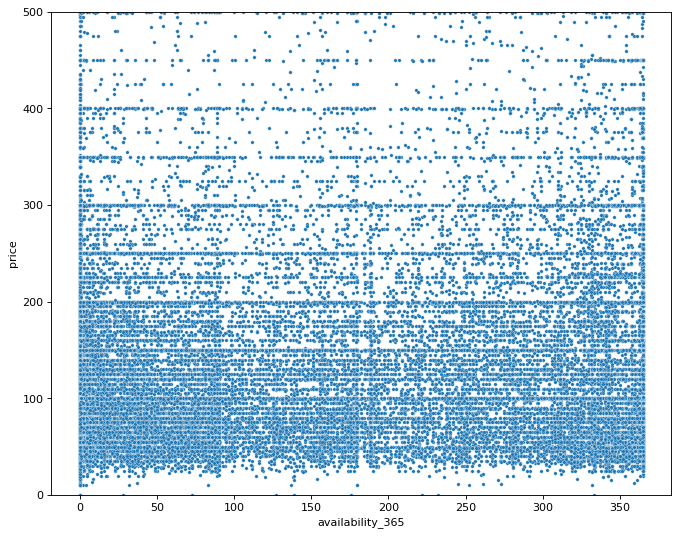

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(10,8), dpi= 80)
sns.scatterplot(x=df.toPandas().availability_365, y=df.toPandas().price, s=10)
plt.ylim(0,500)
plt.show()